# 3D Lennard–Jones Molecular Dynamics Simulation

## Introduction

In this simulation, we model a system of particles in three dimensions that interact via the Lennard–Jones potential. This potential is widely used to capture the behavior of non-bonded interactions, featuring a short-range repulsive part and a long-range attractive part. The potential is given by:

$$
V(r) = 4\epsilon \left[\left(\frac{\sigma}{r}\right)^{12} - \left(\frac{\sigma}{r}\right)^6\right],
$$

where:
- \( \epsilon \) represents the depth of the potential well,
- \( \sigma \) is the distance at which the potential is zero,
- and \( r \) is the distance between two particles.

## Periodic Boundary Conditions

We simulate the particles in a cubic box of side length \( L \) and apply periodic boundary conditions. This means that when a particle leaves one side of the box, it re-enters from the opposite side. The minimum image convention is used to calculate distances between particles so that each particle interacts with the closest image of every other particle.

## Velocity Verlet Integration

To evolve the system in time, we use the velocity Verlet algorithm. The update rules for each time step are:

1. **Position Update:**
   
   $$
   \mathbf{r}_{n+1} = \mathbf{r}_n + \mathbf{v}_n \Delta t + \frac{1}{2} \mathbf{a}_n \Delta t^2,
   $$

2. **Force and Acceleration Calculation:**
   
   Forces are computed using the Lennard–Jones formula, and acceleration is obtained via Newton's second law (assuming unit mass):

   $$
   \mathbf{a} = \frac{\mathbf{F}}{m} \quad (\text{with } m=1).
   $$

3. **Velocity Update:**
   
   $$
   \mathbf{v}_{n+1} = \mathbf{v}_n + \frac{1}{2}(\mathbf{a}_n + \mathbf{a}_{n+1}) \Delta t.
   $$

## Thermostat for Constant Temperature (NVT) Simulations

For constant temperature simulations, a simple thermostat is applied. After updating velocities, we calculate the instantaneous temperature using the kinetic energy (assuming \( m = 1 \) and \( k_B = 1 \)) and then rescale the velocities to match a target temperature \( T_{\text{target}} \):

$$
\text{scaling factor} = \sqrt{\frac{T_{\text{target}}}{\langle v^2 \rangle}},
$$

where \( \langle v^2 \rangle \) is the average squared velocity of the particles.

## Recap

- **Force Calculation:**  
  The pairwise Lennard–Jones forces are computed using the minimum image convention to correctly account for periodic boundaries.

- **Integration:**  
  The velocity Verlet algorithm is used to update positions and velocities in a time-reversible and energy-conserving manner.

- **Thermostat:**  
  When running an NVT simulation, a thermostat is applied to rescale the velocities, ensuring that the target temperature is maintained.

- **Visualization:**  
  The final positions (often projected onto a 2D plane) provide insight into the configuration of the particles under different simulation conditions.

This framework serves as a solid foundation for studying molecular dynamics in soft condensed matter systems. You can experiment with parameters such as \( \epsilon \), \( \sigma \), the number of particles \( N \), and the simulation duration to further explore the system's behavior.


### Change the parameters below for varying results:


In [4]:
# Simulation parameters (fewer steps for clear visualization)
N = 50          # Number of particles
L = 10.0        # Box length
steps = 300     # Number of simulation steps
dt = 0.005      # Time step

### Code for running the simulations and getting the GIF:

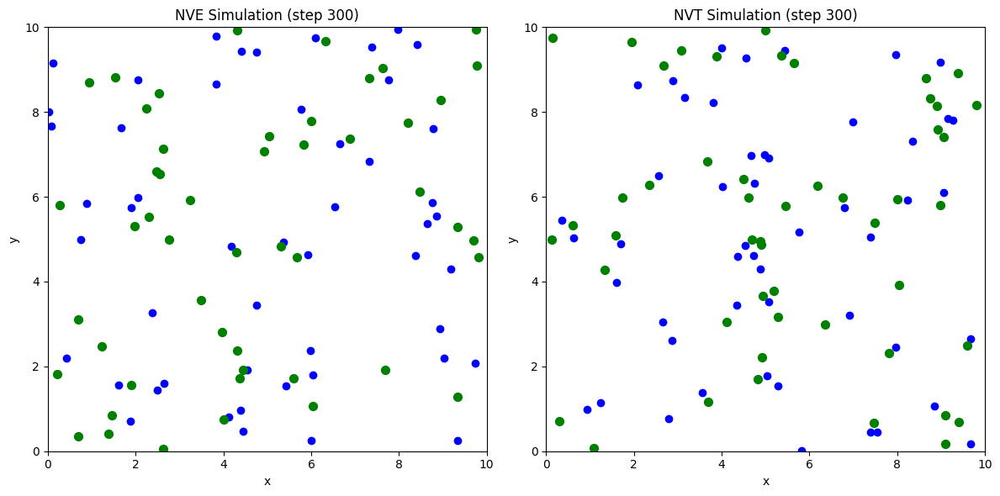

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML

def compute_forces(positions, L, epsilon=1.0, sigma=1.0, r_cutoff=2.5):
    """
    Compute Lennard–Jones forces for particles in 3D with periodic boundary conditions.
    
    Parameters:
        positions (np.array): (N,3) array of particle positions.
        L (float): Length of the cubic simulation box.
        epsilon (float): Depth of the potential well.
        sigma (float): Distance at which the potential is zero.
        r_cutoff (float): Interaction cutoff distance (in units of sigma).
    
    Returns:
        forces (np.array): (N,3) array of forces on each particle.
    """
    N = positions.shape[0]
    forces = np.zeros_like(positions)
    for i in range(N):
        for j in range(i+1, N):
            # Minimum image convention:
            dx = positions[i] - positions[j]
            dx -= L * np.rint(dx / L)
            r = np.linalg.norm(dx)
            if r < r_cutoff and r > 1e-12:
                f_scalar = 24 * epsilon * (2 * sigma**12 / r**13 - sigma**6 / r**7)
                force_vec = f_scalar * dx
                forces[i] += force_vec
                forces[j] -= force_vec
    return forces

def simulate_lj_3d(N, L, steps, dt, epsilon=1.0, sigma=1.0, r_cutoff=2.5,
                   constant_temperature=False, target_temp=1.0):
    """
    Run a 3D Lennard–Jones molecular dynamics simulation.
    
    Parameters:
        N (int): Number of particles.
        L (float): Length of the cubic simulation box.
        steps (int): Number of simulation time steps.
        dt (float): Time step size.
        epsilon (float): Lennard–Jones epsilon parameter.
        sigma (float): Lennard–Jones sigma parameter.
        r_cutoff (float): Interaction cutoff distance.
        constant_temperature (bool): If True, apply a velocity-rescaling thermostat.
        target_temp (float): Target temperature (with m and k_B set to 1).
    
    Returns:
        pos_history (np.array): Array of positions over time (shape: (steps+1, N, 3)).
    """
    positions = np.random.rand(N, 3) * L
    velocities = np.random.randn(N, 3)
    velocities -= np.mean(velocities, axis=0)
    pos_history = [positions.copy()]
    
    for step in range(steps):
        forces = compute_forces(positions, L, epsilon, sigma, r_cutoff)
        positions += velocities * dt + 0.5 * forces * dt**2
        positions %= L  # apply periodic boundary conditions
        new_forces = compute_forces(positions, L, epsilon, sigma, r_cutoff)
        velocities += 0.5 * (forces + new_forces) * dt
        if constant_temperature:
            current_temp = np.mean(np.sum(velocities**2, axis=1)) / 3.0
            scaling_factor = np.sqrt(target_temp / (current_temp + 1e-8))
            velocities *= scaling_factor
        pos_history.append(positions.copy())
    
    return np.array(pos_history)



# Run simulations
pos_history_nve = simulate_lj_3d(N, L, steps, dt, epsilon=1.0, sigma=1.0, constant_temperature=False)
pos_history_nvt = simulate_lj_3d(N, L, steps, dt, epsilon=1.0, sigma=1.0, constant_temperature=True, target_temp=1.0)

# Extract initial positions (same for both simulations as they are randomized)
initial_positions_nve = pos_history_nve[0]
initial_positions_nvt = pos_history_nvt[0]
final_positions_nve = pos_history_nve[-1]
final_positions_nvt = pos_history_nvt[-1]

# Create a figure with two subplots: one for NVE and one for NVT
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
ax_nve, ax_nvt = axes

for ax in axes:
    ax.set_xlim(0, L)
    ax.set_ylim(0, L)
    ax.set_xlabel("x")
    ax.set_ylabel("y")

ax_nve.set_title("NVE Simulation")
ax_nvt.set_title("NVT Simulation")

# Plot initial positions as reference
ax_nve.scatter(initial_positions_nve[:, 0], initial_positions_nve[:, 1], color='blue', marker='o', label='Initial')
ax_nvt.scatter(initial_positions_nvt[:, 0], initial_positions_nvt[:, 1], color='blue', marker='o', label='Initial')

# Create scatter plots for animated positions
scat_nve = ax_nve.scatter(initial_positions_nve[:, 0], initial_positions_nve[:, 1], color='green', s=50)
scat_nvt = ax_nvt.scatter(initial_positions_nvt[:, 0], initial_positions_nvt[:, 1], color='green', s=50)

def update(frame):
    # Update the scatter plot for each simulation (project onto x-y plane)
    data_nve = pos_history_nve[frame][:, :2]
    data_nvt = pos_history_nvt[frame][:, :2]
    scat_nve.set_offsets(data_nve)
    scat_nvt.set_offsets(data_nvt)
    
    ax_nve.set_title(f"NVE Simulation (step {frame})")
    ax_nvt.set_title(f"NVT Simulation (step {frame})")
    return scat_nve, scat_nvt

# Create animation
anim = FuncAnimation(fig, update, frames=len(pos_history_nve), interval=50, blit=False)

# Save the animation as a GIF file (requires Pillow installed)
anim.save("lj_simulation.gif", writer=PillowWriter(fps=20))

plt.tight_layout()
plt.show()

# Optionally, display the GIF inline (in a Jupyter Notebook)
HTML(anim.to_jshtml())
